In [3]:
!pip install -q cython pyyaml==5.1
!pip install -q -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

     |████████████████████████████████| 276kB 7.0MB/s 


In [4]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -q -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 4956, done.
remote: Total 4956 (delta 0), reused 0 (delta 0), pack-reused 4956
Receiving objects: 100% (4956/4956), 2.43 MiB | 4.24 MiB/s, done.
Resolving deltas: 100% (3547/3547), done.


In [1]:
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import glob

import os
import ntpath
import numpy as np
import cv2
import random
import itertools
import pandas as pd
from tqdm import tqdm
import urllib
import json
import PIL.Image as Image

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode

import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc

%matplotlib inline
%config InlineBackend.figure_format='retina'

sns.set(style='whitegrid', palette='muted', font_scale=1.2)

HAPPY_COLORS_PALETTE = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]

sns.set_palette(sns.color_palette(HAPPY_COLORS_PALETTE))

rcParams['figure.figsize'] = 12, 8

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
!gdown --id 1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS

Downloading...
From: https://drive.google.com/uc?id=1K79wJgmPTWamqb04Op2GxW0SW9oxw8KS
To: /content/face_detection.json
100% 274k/274k [00:00<00:00, 39.2MB/s]


In [0]:
face_df = pd.read_json('face_detection.json', lines=True)

In [4]:
face_df.head()

,content,annotation,extras
0,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
1,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
2,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
3,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN
4,http://com.dataturks.a96-i23.open.s3.amazonaws...,"[{'label': ['Face'], 'notes': '', 'points': [{...",NaN


In [5]:
os.makedirs("faces", exist_ok=True)

dataset = []

for index, row in tqdm(face_df.iterrows(), total = face_df.shape[0]):

  img = urllib.request.urlopen(row['content'])
  img = Image.open(img)
  img = img.convert('RGB')

  image_name = f'face_{index}.jpeg'

  img.save(f'faces/{image_name}', "JPEG")

  annotations = row['annotation']

  for an in annotations:

    data = {}

    width = an['imageWidth']
    height = an['imageHeight']
    points = an['points']

    data['file_name'] = image_name
    data['width'] = width
    data['height'] = height


    data['x_min'] = int(round(points[0]['x'] * width))
    data['y_min'] = int(round(points[0]['y'] * height))
    data['x_max'] = int(round(points[1]['x'] * width))
    data['y_max'] = int(round(points[1]['y'] * height))

    data['class_name'] = 'face'

    dataset.append(data)

100%|██████████| 409/409 [03:29<00:00,  1.95it/s]


In [0]:
def annotate_image(annotations, resize = True):

  file_name = annotations.file_name.to_numpy()[0]
  img = cv2.cvtColor(cv2.imread(f'faces/{file_name}'), cv2.COLOR_BGR2RGB)

  for i, a in annotations.iterrows():
    cv2.rectangle(img, (a.x_min, a.y_min), (a.x_max, a.y_max), (0, 255, 0), 2)

  

  if not resize:
    return img

  return cv2.resize(img, (384, 384), interpolation = cv2.INTER_AREA)

In [7]:
df = pd.DataFrame(dataset)

df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,face_0.jpeg,650,333,56,102,112,151,face
1,face_0.jpeg,650,333,379,97,428,156,face
2,face_1.jpeg,1280,697,903,162,985,252,face
3,face_2.jpeg,460,240,216,12,279,80,face
4,face_2.jpeg,460,240,289,2,343,74,face


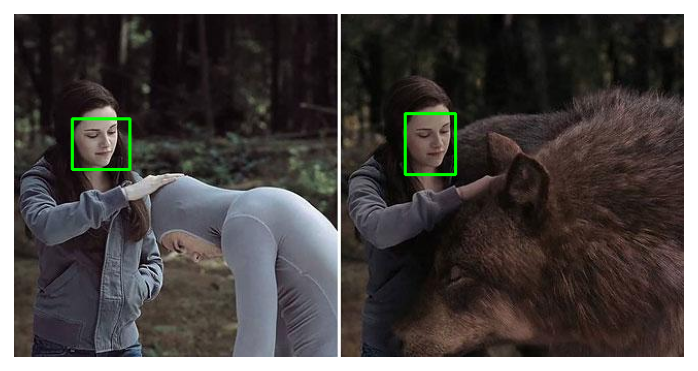

In [8]:
img_df = df[df.file_name == df.file_name.unique()[0]]

img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

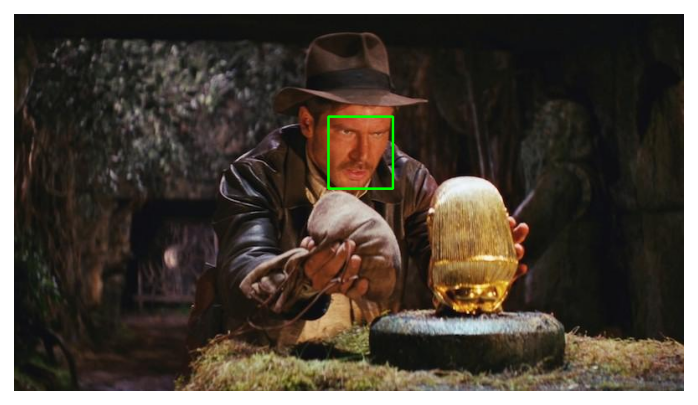

In [9]:
img_df = df[df.file_name == df.file_name.unique()[7]]

img = annotate_image(img_df, resize=False)

plt.imshow(img)
plt.axis('off');

In [0]:
sample_images = [annotate_image(df[df.file_name == f]) for f in df.file_name.unique()[:10]]

sample_images = torch.as_tensor(sample_images)

In [11]:
sample_images.shape

torch.Size([10, 384, 384, 3])

In [0]:
unique_files = df.file_name.unique()

train_files = train_files = set(np.random.choice(unique_files, int(len(unique_files) * 0.95), replace = False))

In [0]:
train_df = df[df.file_name.isin(train_files)]
test_df = df[~df.file_name.isin(train_files)]

In [14]:
print(train_df.shape, test_df.shape)

(1077, 8) (55, 8)


In [0]:
IMAGE_PATH = 'faces'

In [16]:
train_df.head()

,file_name,width,height,x_min,y_min,x_max,y_max,class_name
0,face_0.jpeg,650,333,56,102,112,151,face
1,face_0.jpeg,650,333,379,97,428,156,face
2,face_1.jpeg,1280,697,903,162,985,252,face
3,face_2.jpeg,460,240,216,12,279,80,face
4,face_2.jpeg,460,240,289,2,343,74,face


In [0]:
classes = df.class_name.unique().tolist()

In [0]:
def create_dataset_dicts(df, classes):

  dataset_dicts = []

  for image_id, img_name in enumerate(df.file_name.unique()):

    record = {}

    image_df = df[df.file_name == img_name]

    file_path = f'{IMAGE_PATH}/{img_name}'

    record['file_name'] = file_path
    record['image_id'] = image_id
    record['height'] = int(image_df.iloc[0].height)
    record['width'] = int(image_df.iloc[0].width)

    objs = []

    for _, row in image_df.iterrows():

      xmin = int(row.x_min)
      ymin = int(row.y_min)
      xmax = int(row.x_max)
      ymax = int(row.y_max)

      poly = [
              (xmin, ymin), (xmax, ymin),
              (xmax, ymax), (xmin, ymax)
      ]

      poly = list(itertools.chain.from_iterable(poly))

      obj = {
          
          'bbox': [xmin, ymin, xmax, ymax],
          'bbox_mode': BoxMode.XYWH_ABS,
          'segmentation': [poly],
          'category_id': classes.index(row.class_name),
          'iscrowd': 0
      }

      objs.append(obj)

      record['annotations'] = objs
      dataset_dicts.append(record)
    return dataset_dicts

In [33]:
for d in ['train', 'val']:

  DatasetCatalog.register('faces_' + d, lambda d = d: create_dataset_dicts(train_df if d == "train" else test_df, classes ))

  MetadataCatalog.get("faces_" + d).set(thing_classes = classes)

  statement_metadata = MetadataCatalog.get("faces_train")

AssertionError: ignored

In [0]:
class CocoTrainer(DefaultTrainer):

  @classmethod

  def build_elevator(cls, cfg, dataset_name, output_folder = None):

    if output_folder is None:
      os.makedirs("coco_eval", exist_ok=True)
      output_folder = 'coco_eval'

      return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [0]:
cfg = get_cfg()

cfg.merge_from_file(
  model_zoo.get_config_file(
    "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
  )
)

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
  "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"
)

In [0]:
cfg.DATASETS.TRAIN = ("faces_train",)
cfg.DATASETS.TEST = ('faces_val',)
cfg.DATALOADER.NUM_WORKERS = 4

In [0]:
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05

In [0]:
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(classes)

cfg.TEST.EVAL_PERIOD = 500

In [35]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok= True)

trainer =  CocoTrainer(cfg)
trainer.resume_or_load(resume = False)
trainer.train()

[05/25 20:18:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_2d9806.pkl: 431MB [00:40, 10.7MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[05/25 20:19:03 d2.engine.train_loop]: Starting training from iteration 0
[05/25 20:19:38 d2.utils.events]:  eta: 0:43:08  iter: 19  total_loss: 2.368  loss_cls: 0.651  loss_box_reg: 0.994  loss_mask: 0.681  loss_rpn_cls: 0.032  loss_rpn_loc: 0.014  time: 1.7480  data_time: 0.0370  lr: 0.000020  max_mem: 10106M
[05/25 20:20:13 d2.utils.events]:  eta: 0:42:35  iter: 39  total_loss: 2.081  loss_cls: 0.539  loss_box_reg: 0.959  loss_mask: 0.561  loss_rpn_cls: 0.020  loss_rpn_loc: 0.014  time: 1.7486  data_time: 0.0204  lr: 0.000040  max_mem: 10106M
[05/25 20:20:48 d2.utils.events]:  eta: 0:41:58  iter: 59  total_loss: 1.785  loss_cls: 0.415  loss_box_reg: 0.951  loss_mask: 0.391  loss_rpn_cls: 0.011  loss_rpn_loc: 0.011  time: 1.7481  data_time: 0.0184  lr: 0.000060  max_mem: 10106M
[05/25 20:21:23 d2.utils.events]:  eta: 0:41:22  iter: 79  total_loss: 1.573  loss_cls: 0.330  loss_box_reg: 0.933  loss_mask: 0.288  loss_rpn_cls: 0.007  loss_rpn_loc: 0.010  time: 1.7478  data_time: 0.0207  

In [39]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [53]:
!gdown --id 18Ev2bpdKsBaDufhVKf0cT6RmM3FjW3nL
!mv face_detector.pth output/model_final.pth

Downloading...
From: https://drive.google.com/uc?id=18Ev2bpdKsBaDufhVKf0cT6RmM3FjW3nL
To: /content/face_detector.pth
856MB [00:05, 156MB/s]


In [0]:
os.makedirs("annotated_results", exist_ok=True)

test_image_paths = test_df.file_name.unique()

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)

In [0]:
for clothing_image in test_image_paths:
  file_path = f'{IMAGE_PATH}/{clothing_image}'
  im = cv2.imread(file_path)
  outputs = predictor(im)
  v = Visualizer(
    im[:, :, ::-1],
    metadata=statement_metadata, 
    scale=1., 
    instance_mode=ColorMode.IMAGE
  )
  instances = outputs["instances"].to("cpu")
  instances.remove('pred_masks')
  v = v.draw_instance_predictions(instances)
  result = v.get_image()[:, :, ::-1]
  file_name = ntpath.basename(clothing_image)
  write_res = cv2.imwrite(f'annotated_results/{file_name}', result)

In [57]:
evaluator = COCOEvaluator("faces_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "faces_val")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/25 21:22:36 d2.data.common]: Serializing 5 elements to byte tensors and concatenating them all ...
[05/25 21:22:36 d2.data.common]: Serialized dataset takes 0.00 MiB
[05/25 21:22:36 d2.evaluation.evaluator]: Start inference on 5 images
[05/25 21:22:37 d2.evaluation.evaluator]: Total inference time: 0:00:00.323256 (0.323256 s / img per device, on 1 devices)
[05/25 21:22:37 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.211438 s / img per device, on 1 devices)
[05/25 21:22:37 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/25 21:22:37 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/25 21:22:37 d2.evaluation.coco_evaluation]: Evaluating predictions ...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.05s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=

OrderedDict([('bbox',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APl': 0.0,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APl': 0.0,
               'APm': nan,
               'APs': nan})])

In [0]:
annotated_images = [f'annotated_results/{f}' for f in test_df.file_name.unique()]

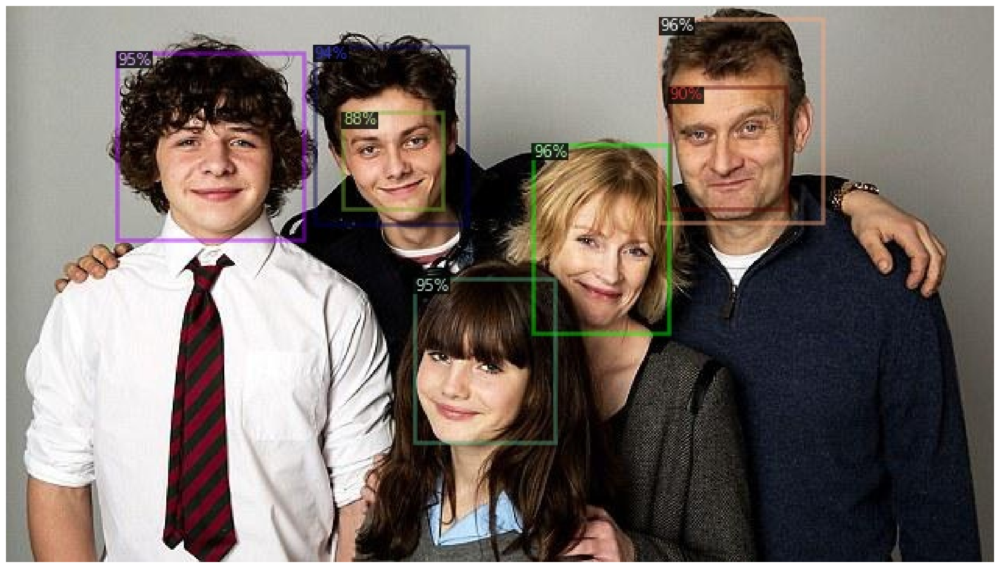

In [61]:
img = cv2.cvtColor(cv2.imread(annotated_images[0]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');

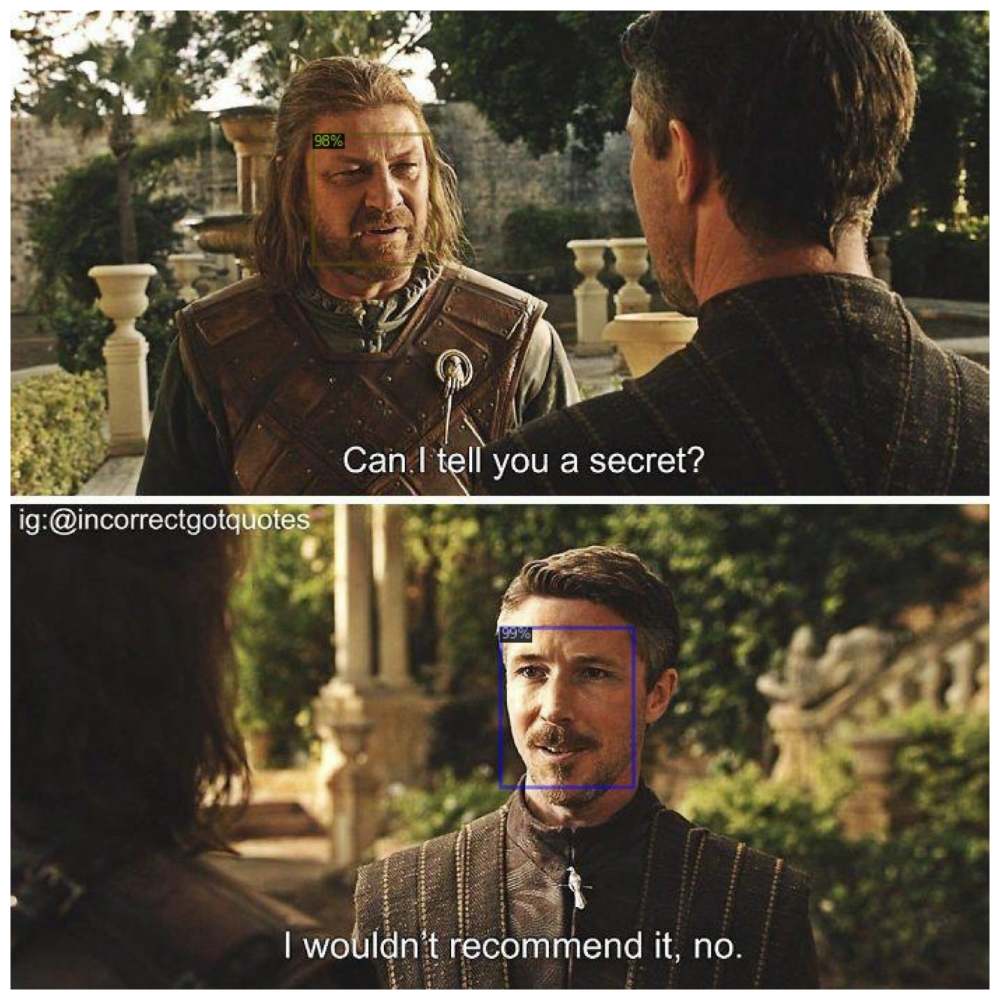

In [62]:
img = cv2.cvtColor(cv2.imread(annotated_images[1]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');

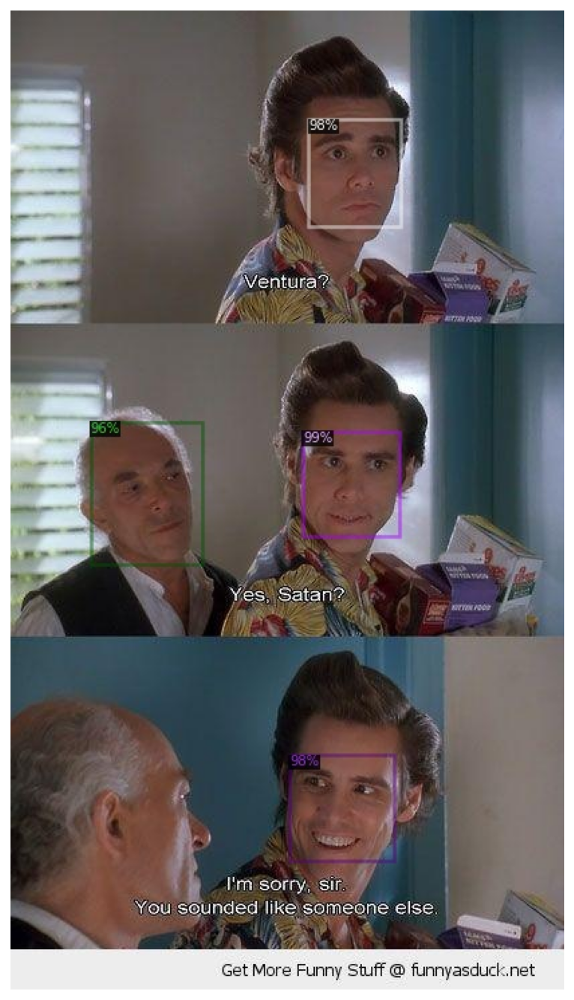

In [63]:
img = cv2.cvtColor(cv2.imread(annotated_images[2]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');

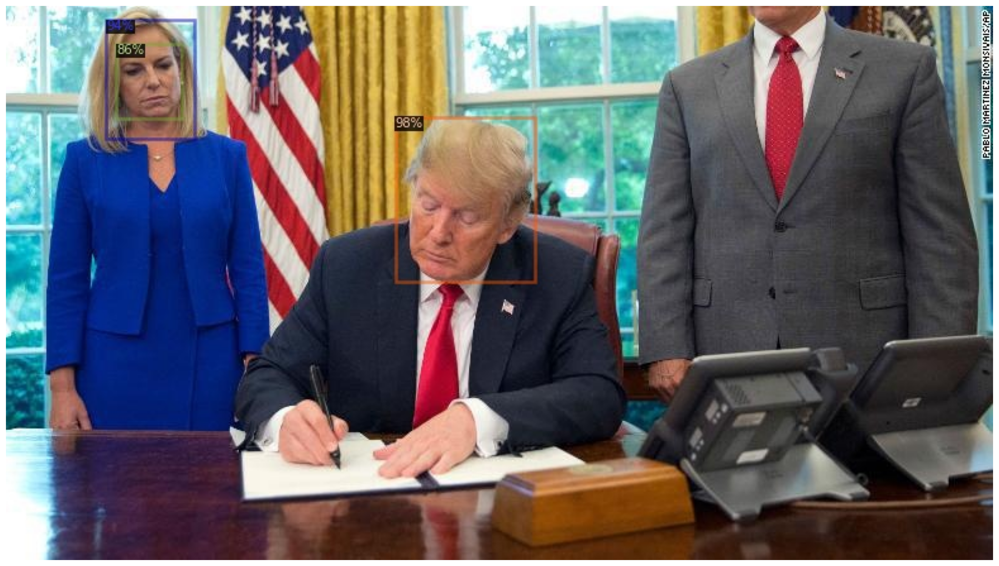

In [64]:
img = cv2.cvtColor(cv2.imread(annotated_images[6]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');

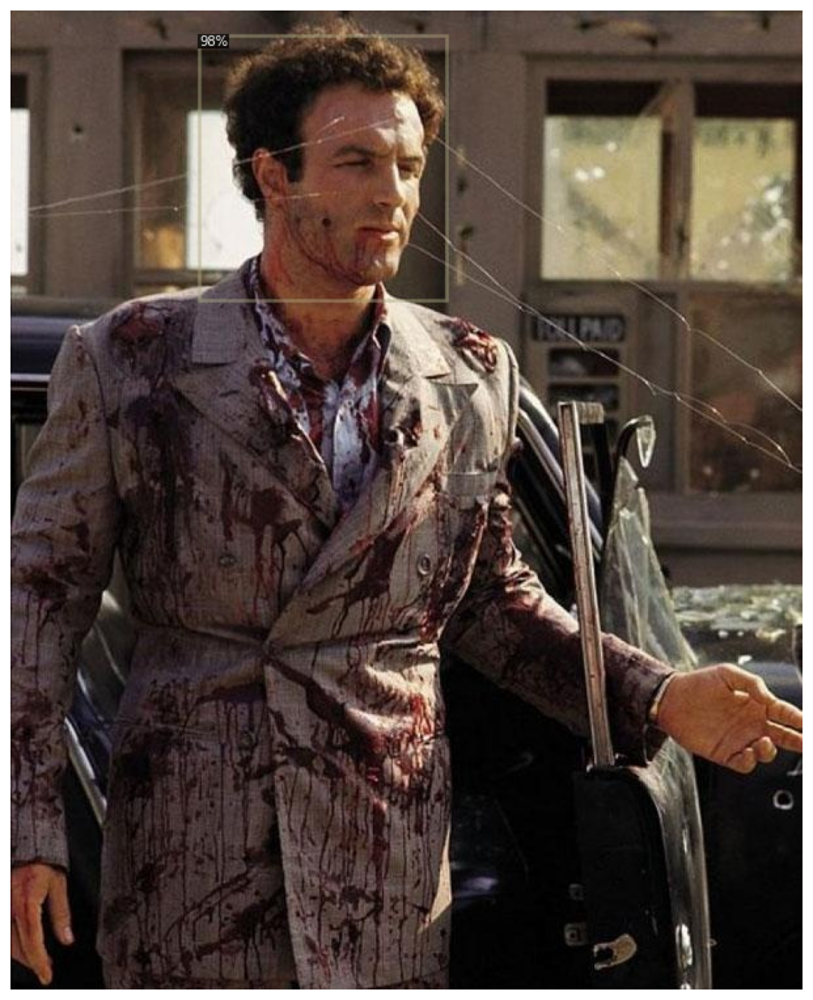

In [65]:
img = cv2.cvtColor(cv2.imread(annotated_images[8]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');

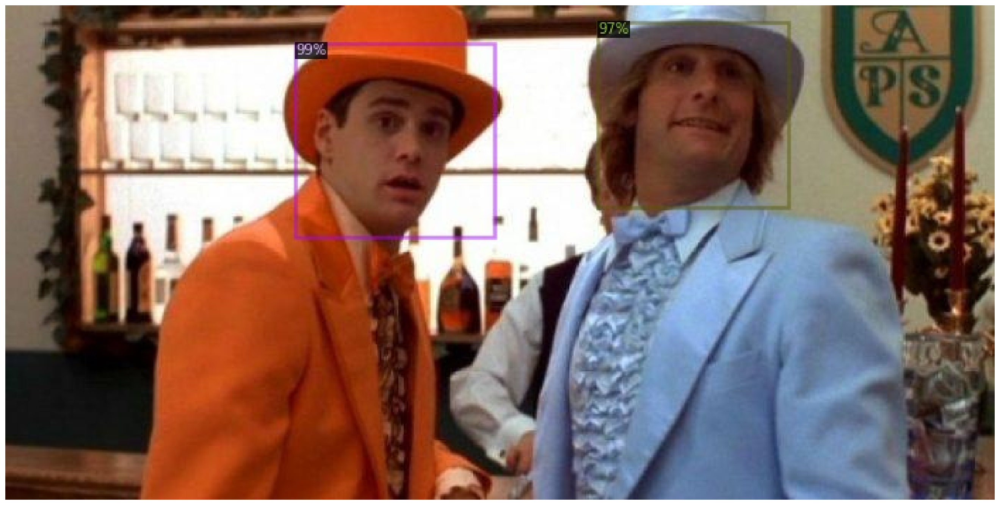

In [66]:
img = cv2.cvtColor(cv2.imread(annotated_images[9]), cv2.COLOR_BGR2RGB)
plt.figure(figsize=(24, 12))
plt.imshow(img)
plt.axis('off');